In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve
from pandas_profiling import ProfileReport

C:\Users\omkar\AppData\Local\Temp\ipykernel_8596\1742979827.py:10: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [2]:
pwd

'C:\\Users\\omkar'

In [3]:
df=pd.read_csv("winequality_red.csv")

In [4]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [5]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [6]:
df.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5
1598,6.0,0.310,0.47,3.6,0.067,18.0,42.0,0.99549,3.39,0.66,11.0,6


In [7]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [8]:
df["quality"].unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [9]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [11]:
x=df.drop(columns="quality")

In [12]:
y=df.quality

In [13]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [14]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [15]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=30)

In [16]:
x_train.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3


In [17]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.20,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.40,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.50,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.20,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.40,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
721,8.9,0.480,0.24,2.85,0.094,35.0,106.0,0.99820,3.10,0.53,9.2
490,9.3,0.775,0.27,2.80,0.078,24.0,56.0,0.99840,3.31,0.67,10.6
575,12.3,0.270,0.49,3.10,0.079,28.0,46.0,0.99930,3.20,0.80,10.2
1051,8.5,0.460,0.59,1.40,0.414,16.0,45.0,0.99702,3.03,1.34,9.2


In [18]:
dt_model=DecisionTreeClassifier()
dt_model

DecisionTreeClassifier()

In [19]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [20]:
import sklearn
from sklearn import tree
%matplotlib inline

In [21]:
sklearn.__version__

'1.0.2'

[Text(0.5486395267681191, 0.9722222222222222, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(0.322474750930589, 0.9166666666666666, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(0.20198913400481716, 0.8611111111111112, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(0.07620566017079046, 0.8055555555555556, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(0.053139369389095685, 0.75, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(0.01751696956426538, 0.6944444444444444, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(0.007006787825706153, 0.6388888888888888, 'X[8] <= 3.38\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(0.0035033939128530766, 0.5833333333333334, 'gini = 0.0\nsamples = 6\nvalue = [0, 0, 0, 6, 0, 0]'),
 Text(0.01051018173855923, 0.583

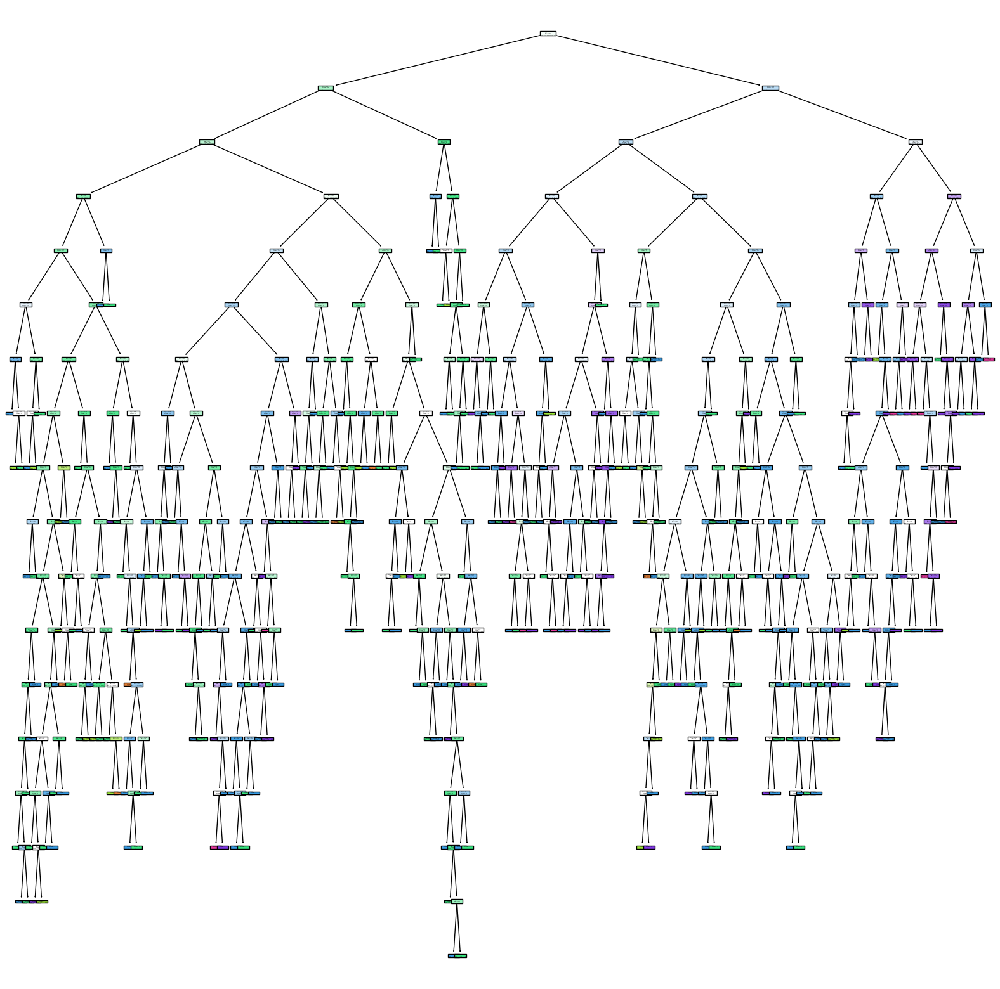

In [22]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [23]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [24]:
df1=df.head(50)

In [25]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [26]:
x1=df1.drop(columns="quality")
y1=df1.quality

In [27]:
dt_model1=DecisionTreeClassifier()
dt_model1

DecisionTreeClassifier()

In [28]:
dt_model1.fit(x1,y1)

DecisionTreeClassifier()

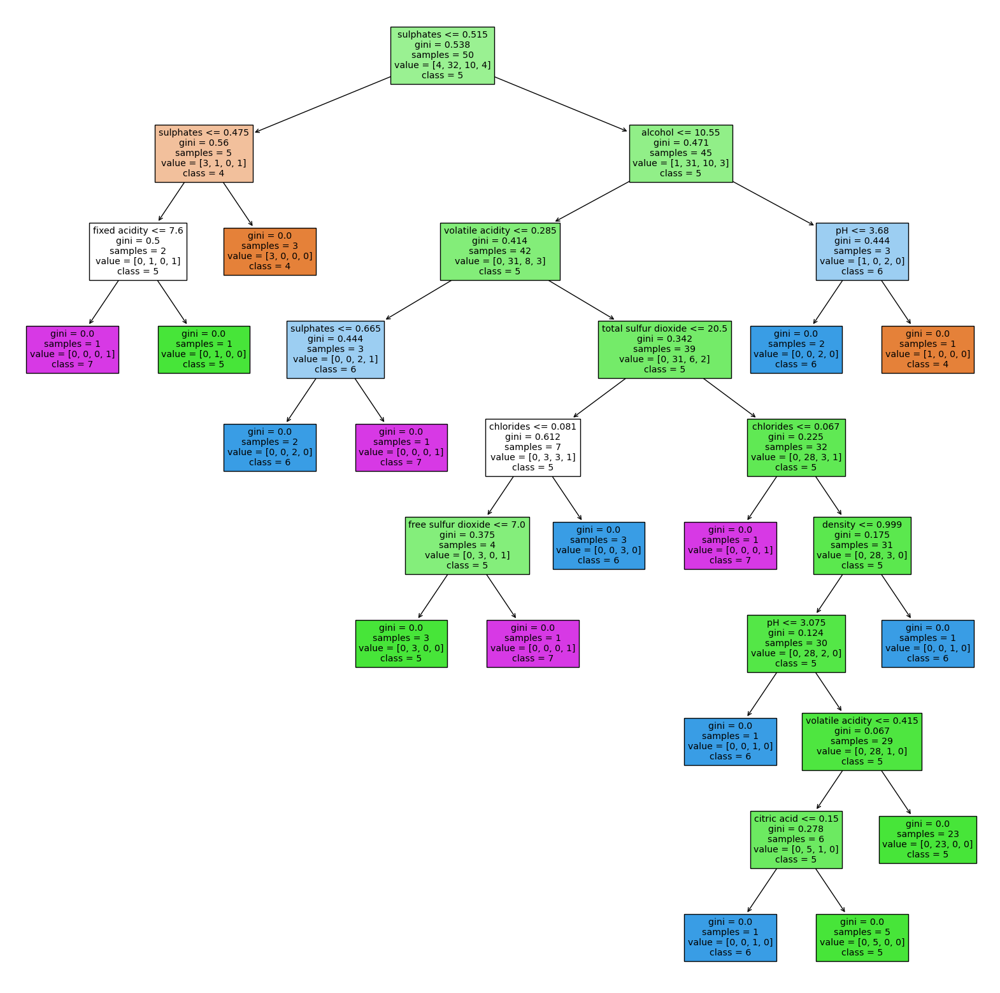

In [31]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True,class_names=[str(i) for i in set(y1)],feature_names=x1.columns)
plt.savefig("dt_model_1")

In [32]:
y1

0     5
1     5
2     5
3     6
4     5
5     5
6     5
7     7
8     7
9     5
10    5
11    5
12    5
13    5
14    5
15    5
16    7
17    5
18    4
19    6
20    6
21    5
22    5
23    5
24    6
25    5
26    5
27    5
28    5
29    6
30    5
31    6
32    5
33    6
34    5
35    6
36    6
37    7
38    4
39    5
40    5
41    4
42    6
43    5
44    5
45    4
46    5
47    5
48    5
49    5
Name: quality, dtype: int64

In [33]:
[str(i) for i in set(y1)]

['4', '5', '6', '7']

In [34]:
set(y1)

{4, 5, 6, 7}

In [35]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [36]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5], dtype=int64)

In [37]:
dt_model1.score(x1,y1)

1.0

In [38]:
dt_model.score(x_test,y_test)

0.6075

In [39]:
path=dt_model1.cost_complexity_pruning_path(x1,y1)
ccp_alpha=path.ccp_alphas

In [40]:
path

{'ccp_alphas': array([0.        , 0.01931034, 0.02      , 0.02666667, 0.02666667,
        0.03      , 0.0348832 , 0.0353629 , 0.036     , 0.04645833,
        0.052     , 0.0576    ]),
 'impurities': array([0.        , 0.03862069, 0.05862069, 0.08528736, 0.11195402,
        0.14195402, 0.21172043, 0.24708333, 0.28308333, 0.376     ,
        0.48      , 0.5376    ])}

In [41]:
ccp_alpha

array([0.        , 0.01931034, 0.02      , 0.02666667, 0.02666667,
       0.03      , 0.0348832 , 0.0353629 , 0.036     , 0.04645833,
       0.052     , 0.0576    ])

In [42]:
dt_model2=[]
for ccp in ccp_alpha:
    dt_m=DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)
    

In [43]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.01931034482758619),
 DecisionTreeClassifier(ccp_alpha=0.02),
 DecisionTreeClassifier(ccp_alpha=0.026666666666666665),
 DecisionTreeClassifier(ccp_alpha=0.026666666666666665),
 DecisionTreeClassifier(ccp_alpha=0.03),
 DecisionTreeClassifier(ccp_alpha=0.03488320355951059),
 DecisionTreeClassifier(ccp_alpha=0.03536290322580643),
 DecisionTreeClassifier(ccp_alpha=0.036000000000000004),
 DecisionTreeClassifier(ccp_alpha=0.04645833333333334),
 DecisionTreeClassifier(ccp_alpha=0.05200000000000002),
 DecisionTreeClassifier(ccp_alpha=0.05760000000000004)]

Text(0, 0.5, 'score')

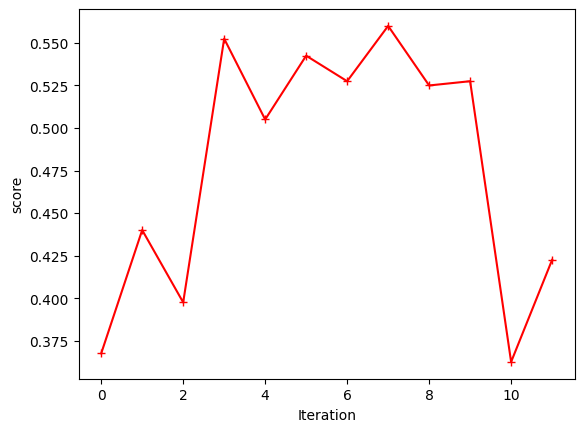

In [44]:
dt_model2=[]
score=[]
for i in ccp_alpha:
    dt_m=DecisionTreeClassifier(ccp_alpha=i)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)
    score.append(dt_m.score(x_test,y_test))
plt.plot(score,"r-+")
plt.xlabel("Iteration")
plt.ylabel("score")

In [45]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.01931034482758619),
 DecisionTreeClassifier(ccp_alpha=0.02),
 DecisionTreeClassifier(ccp_alpha=0.026666666666666665),
 DecisionTreeClassifier(ccp_alpha=0.026666666666666665),
 DecisionTreeClassifier(ccp_alpha=0.03),
 DecisionTreeClassifier(ccp_alpha=0.03488320355951059),
 DecisionTreeClassifier(ccp_alpha=0.03536290322580643),
 DecisionTreeClassifier(ccp_alpha=0.036000000000000004),
 DecisionTreeClassifier(ccp_alpha=0.04645833333333334),
 DecisionTreeClassifier(ccp_alpha=0.05200000000000002),
 DecisionTreeClassifier(ccp_alpha=0.05760000000000004)]

In [46]:
train_score=[i.score(x1,y1) for i in dt_model2]


In [47]:
test_score=[i.score(x_test,y_test) for i in dt_model2]

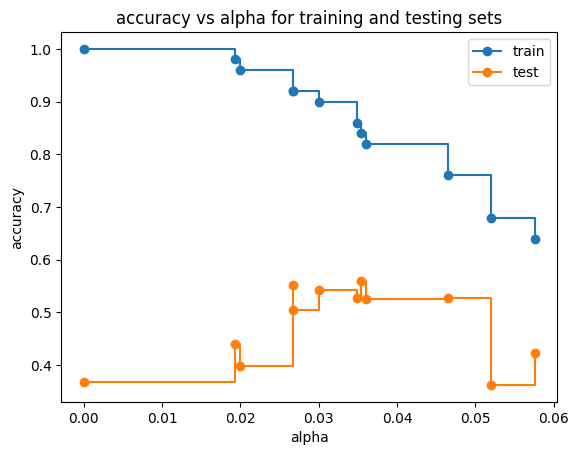

In [48]:
fig,ax=plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha,train_score,marker="o",label="train",drawstyle="steps-post")
ax.plot(ccp_alpha,test_score,marker="o",label="test",drawstyle="steps-post")
ax.legend()
plt.show()

In [49]:
dt_model_ccp=DecisionTreeClassifier(random_state=0,ccp_alpha=.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.44166666666666665, 0.95, 'X[9] <= 0.515\ngini = 0.538\nsamples = 50\nvalue = [4, 32, 10, 4]'),
 Text(0.2, 0.85, 'X[9] <= 0.475\ngini = 0.56\nsamples = 5\nvalue = [3, 1, 0, 1]'),
 Text(0.13333333333333333, 0.75, 'X[10] <= 9.7\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 0, 1]'),
 Text(0.06666666666666667, 0.65, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(0.2, 0.65, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(0.26666666666666666, 0.75, 'gini = 0.0\nsamples = 3\nvalue = [3, 0, 0, 0]'),
 Text(0.6833333333333333, 0.85, 'X[10] <= 10.55\ngini = 0.471\nsamples = 45\nvalue = [1, 31, 10, 3]'),
 Text(0.5, 0.75, 'X[1] <= 0.285\ngini = 0.414\nsamples = 42\nvalue = [0, 31, 8, 3]'),
 Text(0.3333333333333333, 0.65, 'X[6] <= 81.5\ngini = 0.444\nsamples = 3\nvalue = [0, 0, 2, 1]'),
 Text(0.26666666666666666, 0.55, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 2, 0]'),
 Text(0.4, 0.55, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(0.6666666666666666, 0.65, 'X[6] <= 20.5\n

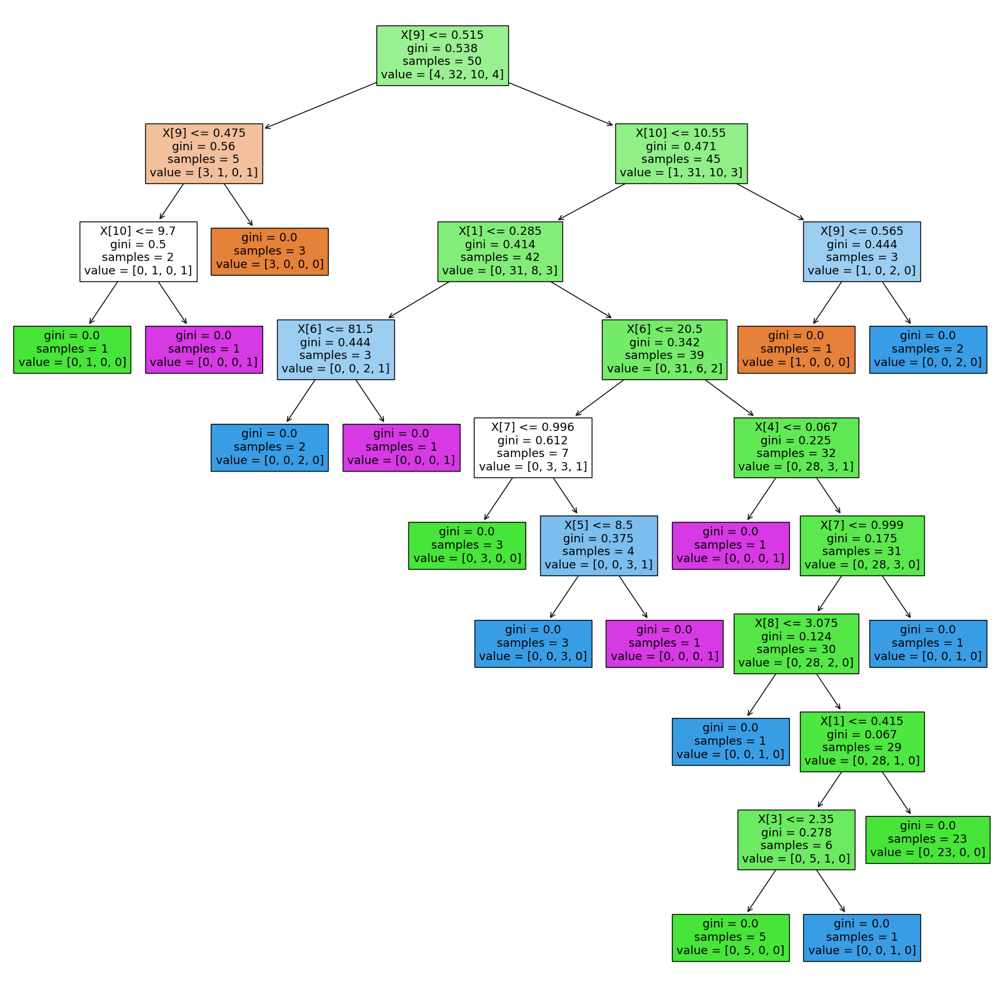

In [50]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [51]:
dt_model_ccp.score(x1,y1)

1.0

In [52]:
dt_model_ccp.score(x_test,y_test)

0.4875

In [53]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [56]:
grid_pram={"criterion":["gini","entropy"],
           "splitter":["best","random"],
           "max_depth":range(2,10,1),
           "min_samples_split":range(2,5,1),
           "min_samples_leaf":range(1,10,1),
           "ccp_alpha":np.random.rand(20)
          }

In [57]:
grid_ccp=GridSearchCV(estimator=dt_model_ccp,param_grid=grid_pram,cv=10,n_jobs=-1)
grid_ccp.fit(x1,y1)

C:\Users\omkar\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(


GridSearchCV(cv=10,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'ccp_alpha': array([0.7865178 , 0.09085311, 0.49256103, 0.55867618, 0.67660078,
       0.45388336, 0.80736712, 0.8649915 , 0.74972006, 0.24583176,
       0.62621051, 0.70533901, 0.81313158, 0.48894187, 0.44648182,
       0.29010383, 0.50629641, 0.50046745, 0.7040398 , 0.65238665]),
                         'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 10),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 5),
                         'splitter': ['best', 'random']})

In [58]:
grid_ccp.best_params_

{'ccp_alpha': 0.090853105151534,
 'criterion': 'entropy',
 'max_depth': 6,
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'splitter': 'random'}

In [59]:
dt_cpp_new=DecisionTreeClassifier(criterion="entropy",max_depth=6,min_samples_leaf=1,min_samples_split=4,splitter="random",ccp_alpha=.090)

In [60]:
dt_cpp_new.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.09, criterion='entropy', max_depth=6,
                       min_samples_split=4, splitter='random')

In [61]:
dt_cpp_new.score(x1,y1)

0.84

In [63]:
dt_cpp_new.score(x_test,y_test)

0.315

In [64]:
pred=dt_cpp_new.predict(x_train)

In [65]:
confusion_matrix(y_train,pred)

array([[  0,   1,   6,   1,   0,   0],
       [  0,  11,  20,   4,   0,   0],
       [  0,  87, 333,  80,  12,   0],
       [  0, 110, 273,  65,  29,   0],
       [  0,  43,  75,  13,  22,   0],
       [  0,   7,   7,   0,   0,   0]], dtype=int64)